# 📈 📊 Apple Stock Price Analysis & Forecast 📊 📈

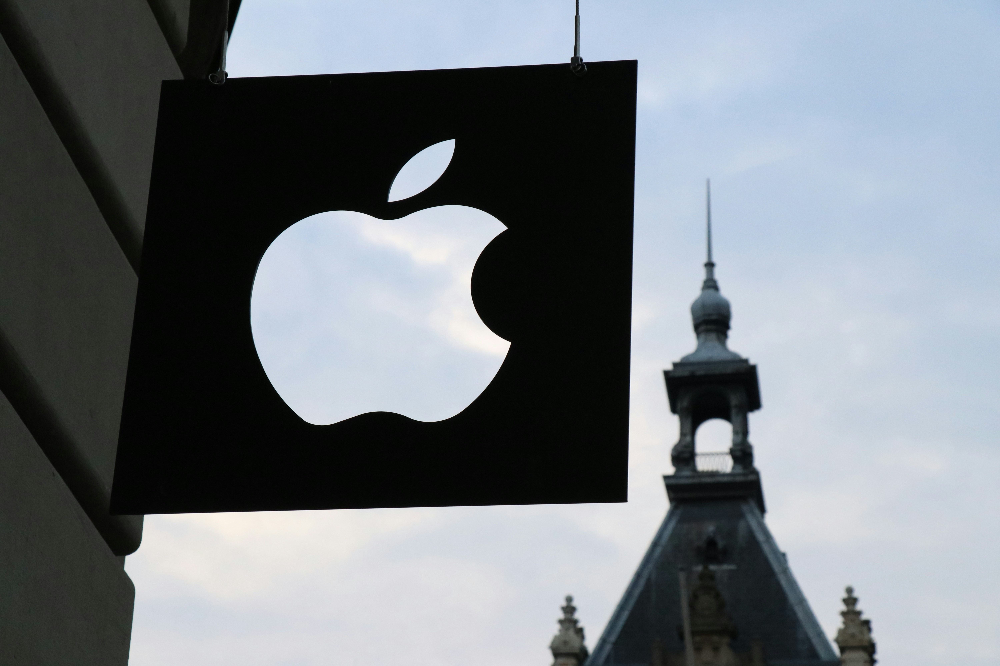

**Introduction**

Apple Inc (Apple) designs, manufactures, and markets smartphones, tablets, personal computers (PCs), portable and wearable devices. The company also offers software and related services, accessories, and third-party digital content and applications. Apple’s product portfolio includes iPhone, iPad, Mac, iPod, Apple Watch, and Apple TV. It offers various consumer and professional software applications such as iOS, macOS, iPadOS, and watchOS, iCloud, AppleCare, Apple Pay, and accessories. Apple sells and delivers digital content and applications through Apple Store, App Store, Apple Arcade, Apple News+, Apple Fitness+, Apple Card, Apple Pay, and Apple Music. The company has business presence across the Americas, Europe, the Middle East, Africa, and Asia-Pacific. Apple is headquartered in Cupertino, California, the US.

In this Code, I have done Data Visualization and Analysis of Apple Company Stock Price. It shows when prices go up or down, correlation b/w values, and more knowledgeable things. In this process, I use these libraries technique (Pandas, NumPy, Matplotlib, Seaborn).

## Importing Libraries

In [6]:
# Import necessary libraries
import pandas as pd  # pandas is used for data manipulation and analysis, providing DataFrame structure for tabular data
import numpy as np  # numpy provides support for numerical operations, especially on arrays
import seaborn as sns  # seaborn is used for creating advanced statistical visualizations easily
import matplotlib.pyplot as plt  # matplotlib is a versatile library for creating basic visualizations (like plots, charts)
from scipy.stats import skew, kurtosis  # scipy.stats provides functions to compute skewness and kurtosis of distributions
from statsmodels.tsa.stattools import adfuller  # statsmodels.tsa.stattools contains tools for time series analysis
from statsmodels.tsa.arima_model import ARIMA  # ARIMA is a class for fitting and predicting ARIMA models
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf  # plot_acf and plot_pacf are functions for visualizing autocorrelations and partial autocorrelations
import plotly.express as px  # plotly.express is used for creating interactive plots
from sklearn.metrics import mean_squared_error
from statsmodels.tsa.seasonal import seasonal_decompose  # seasonal_decompose is used for seasonal decomposition of time series data
from sklearn.preprocessing import MinMaxScaler  # MinMaxScaler is used for scaling data to a specific range
import warnings
warnings.filterwarnings("ignore")  # Ignore warnings to keep the output clean and focused

In [7]:
# Upload the dataset - 'AAPL (1).csv'
# Read the dataset
df = pd.read_csv(r"C:\Users\Admin\Downloads\AAPL (1).csv")
df 

,Date,Open,High,Low,Close,Adj Close,Volume
0,03-01-2012,58.485714,58.928570,58.428570,58.747143,50.765709,75555200
1,04-01-2012,58.571430,59.240002,58.468571,59.062859,51.038536,65005500
2,05-01-2012,59.278572,59.792858,58.952858,59.718571,51.605175,67817400
3,06-01-2012,59.967144,60.392857,59.888573,60.342857,52.144630,79573200
4,09-01-2012,60.785713,61.107143,60.192856,60.247143,52.061932,98506100
...,...,...,...,...,...,...,...
2006,23-12-2019,280.529999,284.250000,280.369995,284.000000,282.054138,24643000
2007,24-12-2019,284.690002,284.890015,282.920013,284.269989,282.322266,12119700
2008,26-12-2019,284.820007,289.980011,284.700012,289.910004,287.923645,23280300
2009,27-12-2019,291.119995,293.970001,288.119995,289.799988,287.814392,36566500


In [8]:
# Columns in the dataset
df.columns

Index(['Date', 'Open', 'High', 'Low', 'Close', 'Adj Close', 'Volume'], dtype='object')

In [9]:
df.shape

(2011, 7)

# **1. Exploratory Data Analysis**

### Statistics

In [12]:
# Technical information of dataset
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2011 entries, 0 to 2010
Data columns (total 7 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   Date       2011 non-null   object 
 1   Open       2011 non-null   float64
 2   High       2011 non-null   float64
 3   Low        2011 non-null   float64
 4   Close      2011 non-null   float64
 5   Adj Close  2011 non-null   float64
 6   Volume     2011 non-null   int64  
dtypes: float64(5), int64(1), object(1)
memory usage: 110.1+ KB


In [13]:
# Discriptive Statistics
df.describe()

,Open,High,Low,Close,Adj Close,Volume
count,2011.000000,2011.000000,2011.000000,2011.000000,2011.000000,2.011000e+03
mean,126.707469,127.827594,125.580258,126.741235,119.505548,5.949670e+07
std,50.483753,50.926301,50.124940,50.578369,52.438444,4.683856e+07
min,55.424286,57.085712,55.014286,55.790001,48.921928,1.136200e+07
25%,85.882858,86.717858,85.056427,86.202145,75.056679,2.758565e+07
50%,113.050003,114.190002,111.870003,113.050003,105.222908,4.346900e+07
75%,165.190002,167.409996,163.424995,165.245002,160.047111,7.471030e+07
max,291.119995,293.970001,288.119995,291.519989,289.522614,3.765300e+08


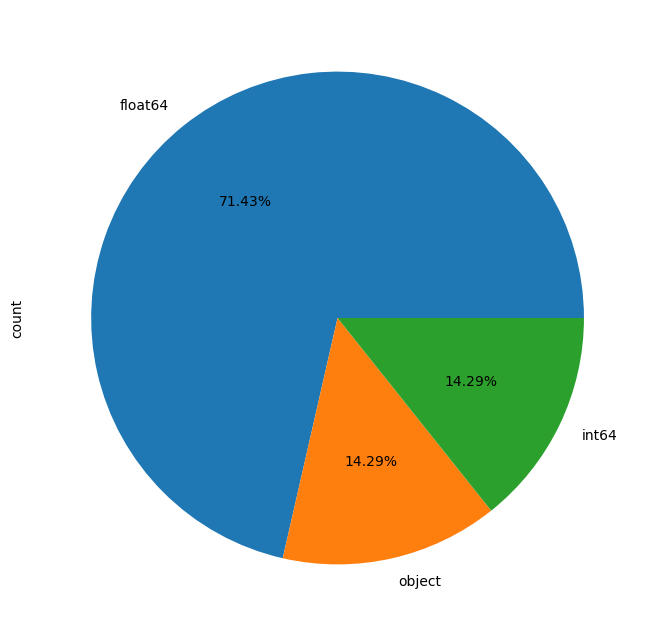

In [14]:
# Visualizing the data types
plt.figure(figsize=(8,8))
df.dtypes.value_counts().plot.pie(autopct='%0.2f%%')
plt.show()

In [15]:
# Presence of null values
df.isnull().sum()

Date         0
Open         0
High         0
Low          0
Close        0
Adj Close    0
Volume       0
dtype: int64

In [16]:
# Presence of duplicate values
df.duplicated().sum()

0

In [17]:
# Converting the date column to datetime datatype
df['Date'] = pd.to_datetime(df['Date'], format= '%d-%m-%Y')

In [18]:
# Making the date as the index
df.set_index('Date', inplace=True)
df

,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2012-01-03,58.485714,58.928570,58.428570,58.747143,50.765709,75555200
2012-01-04,58.571430,59.240002,58.468571,59.062859,51.038536,65005500
2012-01-05,59.278572,59.792858,58.952858,59.718571,51.605175,67817400
2012-01-06,59.967144,60.392857,59.888573,60.342857,52.144630,79573200
2012-01-09,60.785713,61.107143,60.192856,60.247143,52.061932,98506100
...,...,...,...,...,...,...
2019-12-23,280.529999,284.250000,280.369995,284.000000,282.054138,24643000
2019-12-24,284.690002,284.890015,282.920013,284.269989,282.322266,12119700
2019-12-26,284.820007,289.980011,284.700012,289.910004,287.923645,23280300


### Visualizing the data over time

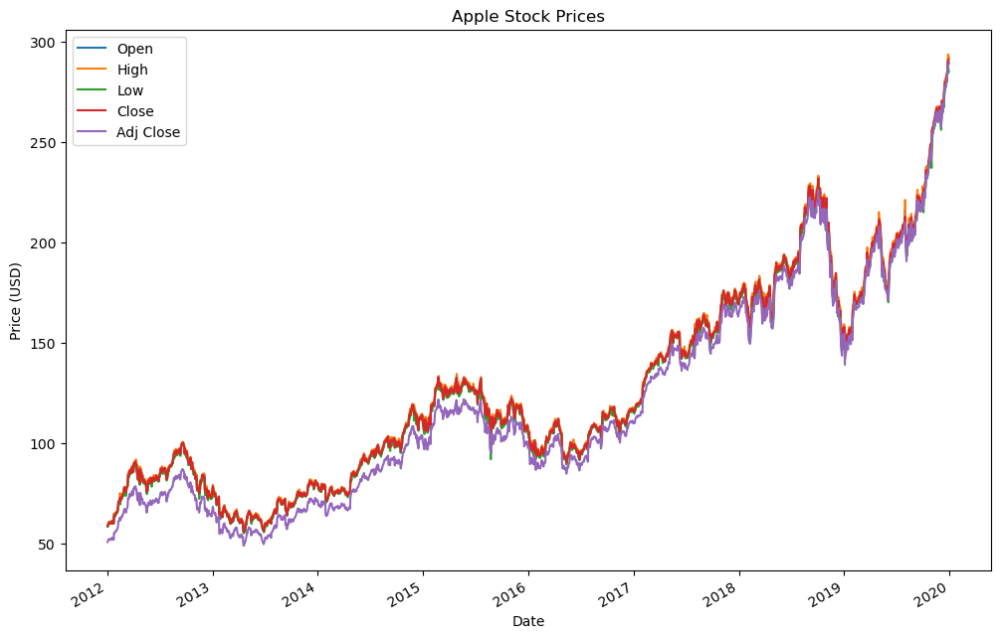

In [20]:
# Plotting of whole dataset
df[['Open','High','Low','Close','Adj Close']].plot(figsize=(12, 8))
plt.title('Apple Stock Prices')
plt.xlabel('Date')
plt.ylabel('Price (USD)')
plt.show()

From 2012 to 2018 the Adj Close is lower than Close and is more prominent

Overall the adj close is lower than the Close

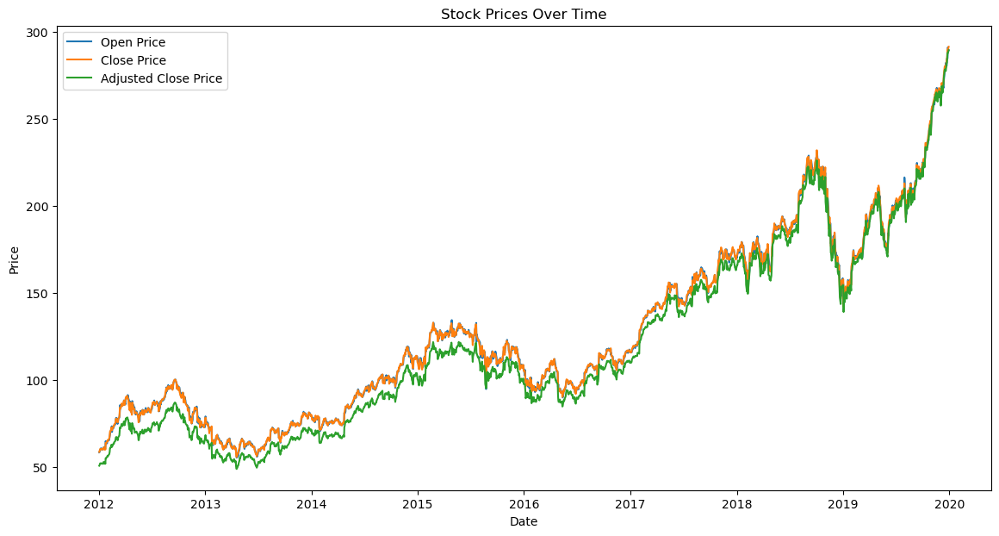

In [22]:
# Plot the 'Open', 'Close', and 'Adj Close' prices
plt.figure(figsize=(14, 7))
plt.plot(df['Open'], label='Open Price')
plt.plot(df['Close'], label='Close Price')
plt.plot(df['Adj Close'], label='Adjusted Close Price')
plt.title('Stock Prices Over Time')
plt.xlabel('Date')
plt.ylabel('Price')
plt.legend()
plt.show()

The Adjusted Close (Adj Close) represents the stock's closing price after accounting for corporate actions such as dividends, stock splits, and rights offerings. It's a better representation of the true value of the stock than the raw Close price, especially when modeling or performing technical analysis.

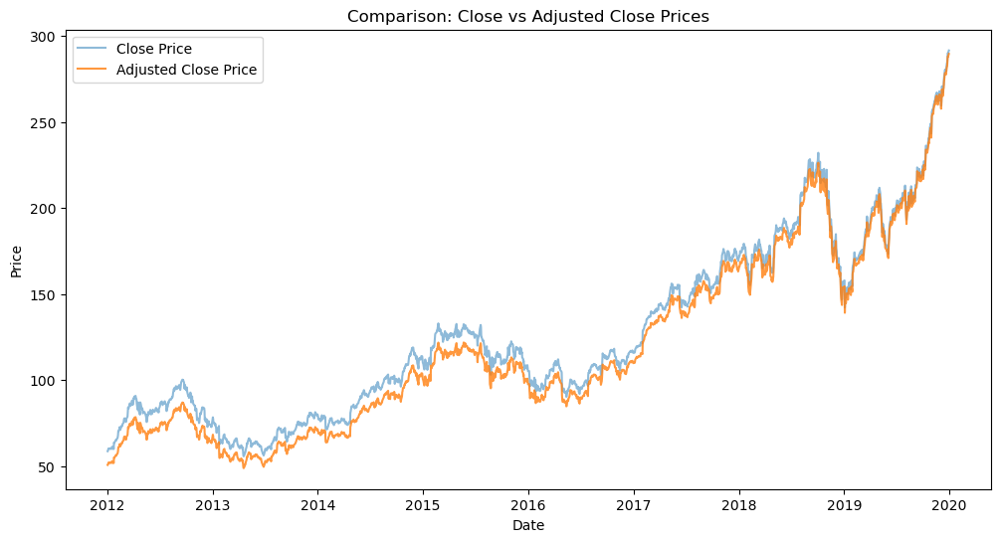

In [24]:
# Plot Close vs Adj Close
plt.figure(figsize=(12, 6))
plt.plot(df['Close'], label='Close Price', alpha=0.5)
plt.plot(df['Adj Close'], label='Adjusted Close Price', alpha=0.8)
plt.title('Comparison: Close vs Adjusted Close Prices')
plt.xlabel('Date')
plt.ylabel('Price')
plt.legend()
plt.show()

Observation:

Line plot of Close price & Adj Close shows uptrend and no observable patterns.

Signgificant rise from 2017 to 2019 can be observed.

Overall price of stock shows uptrend

The Adj close price is generally lower than the close price

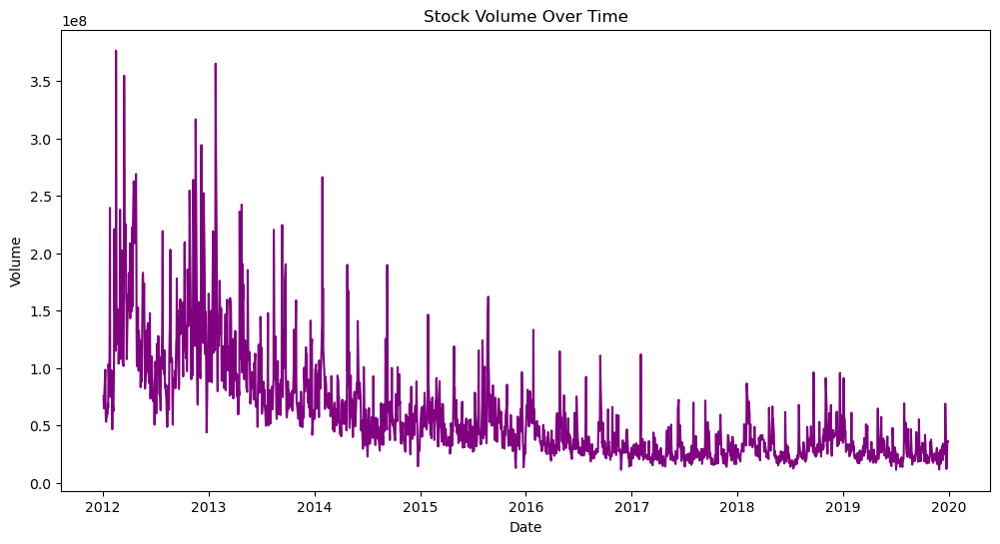

In [26]:
# Plot Volume over time
plt.figure(figsize=(12, 6))
plt.plot(df['Volume'], color='purple')
plt.title('Stock Volume Over Time')
plt.xlabel('Date')
plt.ylabel('Volume')
plt.show()

Observation:

Line plot of 'Adj Close', 'Close', 'Open', 'High', 'Low' features shows that their behaviour is same. Their overall trend is upward

Volume plot shows more noise ie outliers presence.

Volume overall trend is downward

Volume
36660000    2
37586800    2
36529700    2
50190000    2
24358400    2
           ..
33152000    1
40270000    1
44184000    1
33478000    1
36028600    1
Name: count, Length: 2006, dtype: int64 



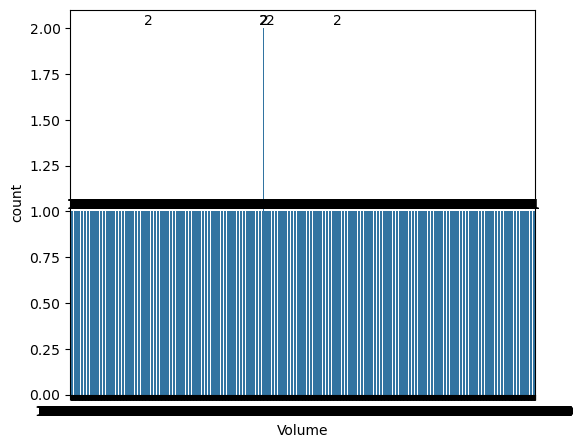

In [28]:
# Visualizing the volume using count plot
print(df['Volume'].value_counts(),'\n')
plt.figure(figsize=(6,5))

ax = sns.countplot(data=df, x='Volume')
ax.bar_label(ax.containers[0])
plt.show()

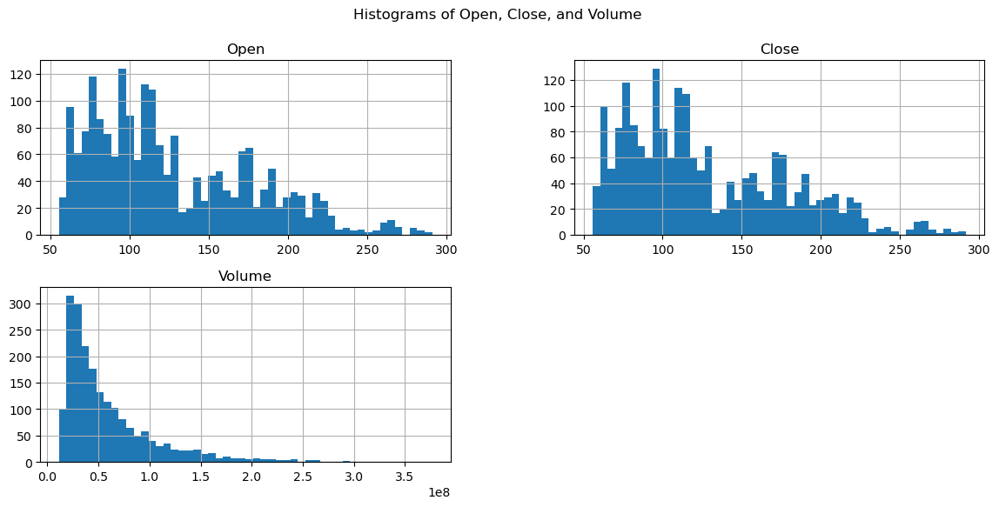

In [29]:
# Histograms for Open, Close, and Volume
df[['Open', 'Close', 'Volume']].hist(bins=50, figsize=(14, 6))
plt.suptitle('Histograms of Open, Close, and Volume')
plt.show()

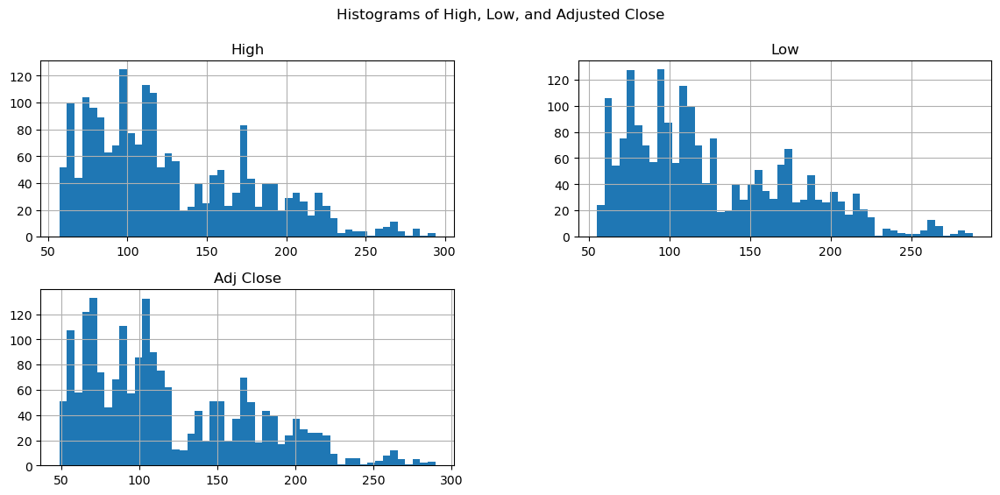

In [30]:
# Histograms for High, Low, and Adj Close
df[['High', 'Low', 'Adj Close']].hist(bins=50, figsize=(14, 6))
plt.suptitle('Histograms of High, Low, and Adjusted Close')
plt.show()

In [31]:
# Calulating the kurtosis values for the columns
df.kurtosis()

Open        -0.172115
High        -0.174501
Low         -0.161621
Close       -0.155038
Adj Close   -0.165254
Volume       6.322219
dtype: float64

Observation:

Volume feature has high kurtosis value and confirms presence of outliers.

Whereas, other features have low kurtosis and have low / nil outliers.

### **# Outlier Detection and Treatment**

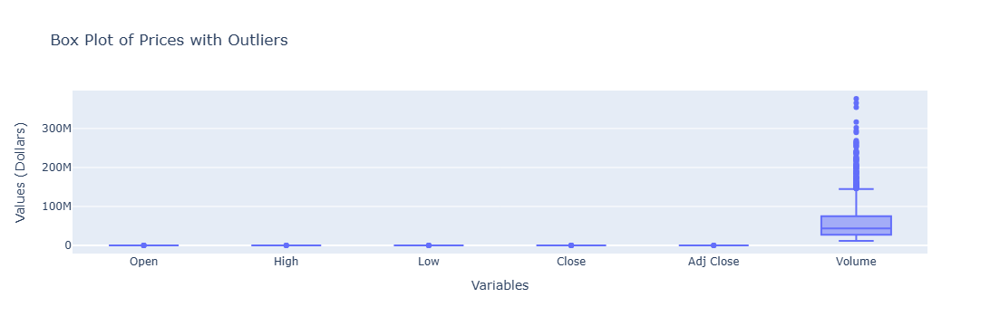

In [34]:
# Presence of outliers
# Box plot to check outliers in - 'Open' 'High' 'Low' 'Close' 'Adj Close' 'Volume'
outliers = px.box(df[['Open','High','Low','Close','Adj Close','Volume']], title='Box Plot of Prices with Outliers')
outliers.update_xaxes(title_text='Variables')
outliers.update_yaxes(title_text='Values (Dollars)')
outliers.show()

In [35]:
# Skewness in the dataset
df.skew(numeric_only=True)

Open         0.769351
High         0.770934
Low          0.770876
Close        0.773838
Adj Close    0.794056
Volume       2.165046
dtype: float64

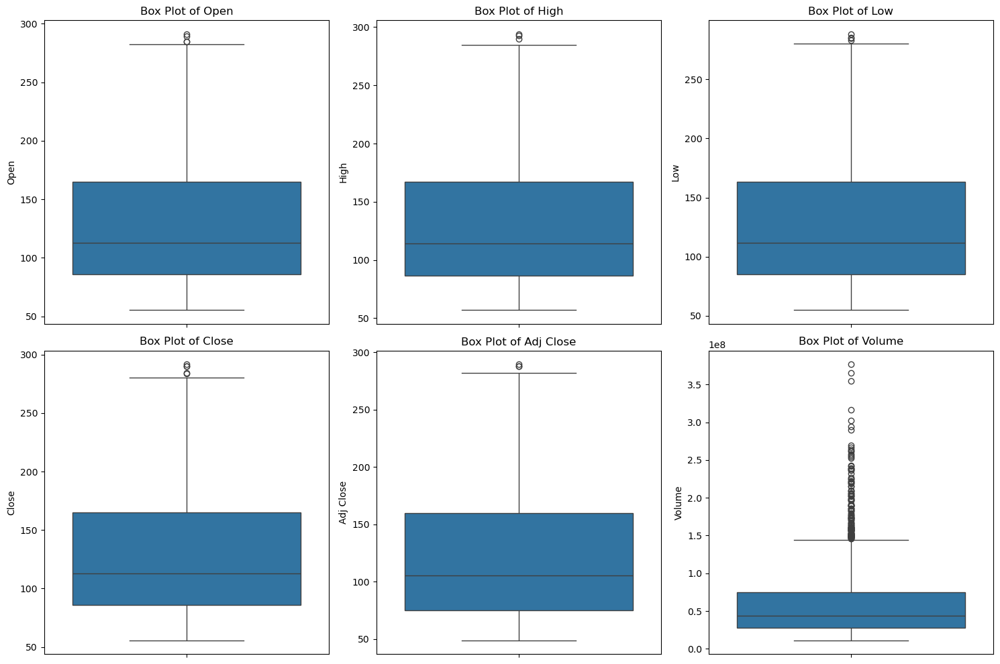

In [36]:
# List of columns to plot boxplots
columns = ['Open', 'High', 'Low', 'Close', 'Adj Close', 'Volume']

# Create subplots - 2 rows and 3 columns (adjust depending on the number of columns)
fig, axs = plt.subplots(nrows=2, ncols=3, figsize=(15, 10))

# Flatten the axes array for easy indexing
axs = axs.flatten()

# Plot a boxplot for each column
for i, col in enumerate(columns):
    sns.boxplot(data=df, y=col, ax=axs[i])
    axs[i].set_title(f'Box Plot of {col}')

# Adjust layout to prevent overlap
plt.tight_layout()
plt.show()

In [37]:
# Outlier Treatment
# Percentile capping for 'Open', 'Close', 'Adj Close', 'High', 'Low' columns
for col in ['Open', 'Close', 'Adj Close', 'High', 'Low']:
    upper_limit = df[col].quantile(0.99)
    lower_limit = df[col].quantile(0.01)
    df[col] = np.clip(df[col], lower_limit, upper_limit)

In [38]:
# IQR method for Volume column
Q1 = df['Volume'].quantile(0.25)
Q3 = df['Volume'].quantile(0.75)
IQR = Q3 - Q1

In [39]:
# Define outlier bounds
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

In [40]:
# Treat outliers in the Volume column
df['Volume'] = np.where(df['Volume'] > upper_bound, upper_bound,
                        np.where(df['Volume'] < lower_bound, lower_bound, df['Volume']))

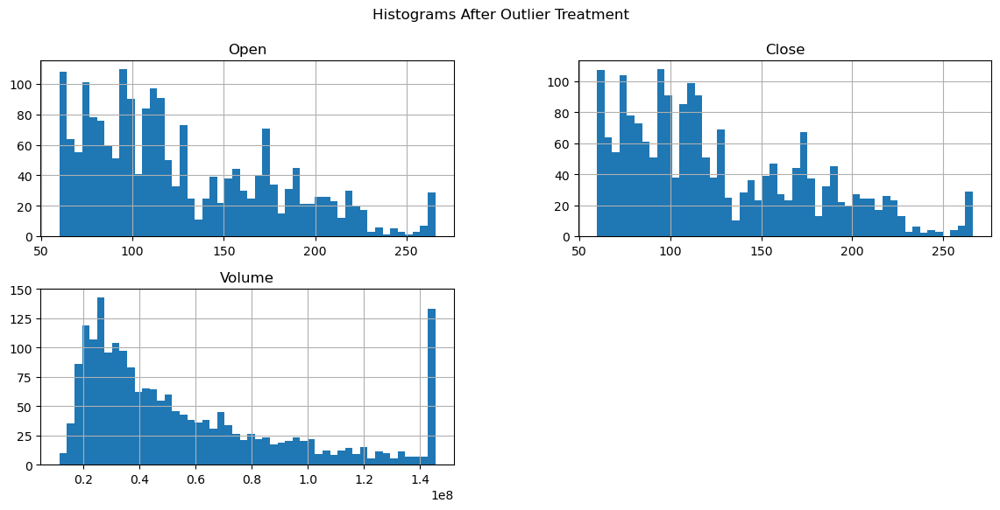

In [41]:
# After outlier treatment, recheck the distributions
df[['Open', 'Close', 'Volume']].hist(bins=50, figsize=(14, 6))
plt.suptitle('Histograms After Outlier Treatment')
plt.show()

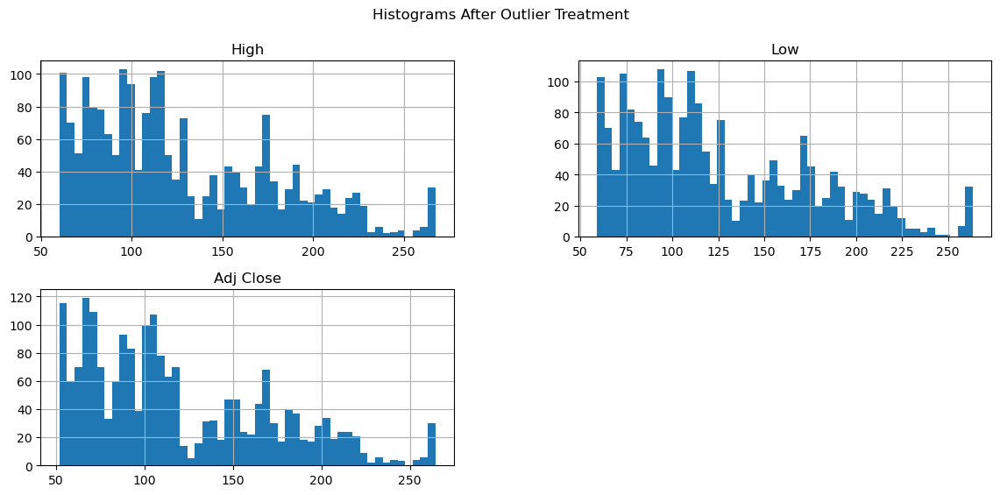

In [42]:
# After outlier treatment, recheck the distributions
df[['High', 'Low', 'Adj Close']].hist(bins=50, figsize=(14, 6))
plt.suptitle('Histograms After Outlier Treatment')
plt.show()

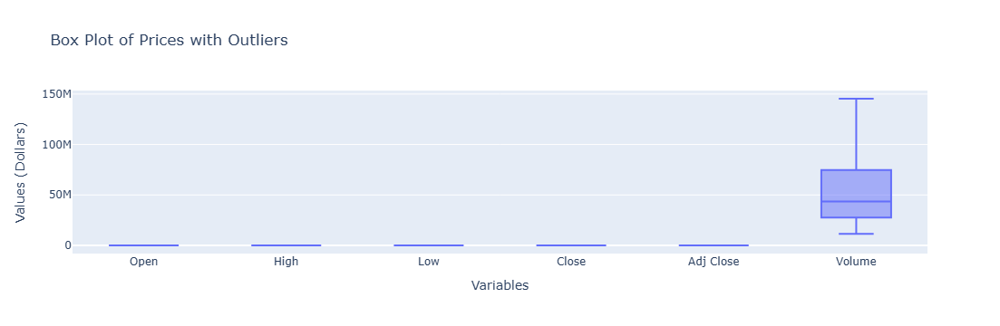

In [43]:
# Presence of outliers
# Box plot to check outliers in - 'Open' 'High' 'Low' 'Close' 'Adj Close' 'Volume'
outliers = px.box(df[['Open','High','Low','Close','Adj Close','Volume']], title='Box Plot of Prices with Outliers')
outliers.update_xaxes(title_text='Variables')
outliers.update_yaxes(title_text='Values (Dollars)')
outliers.show()

### **# Time resampling**

In [45]:
# Year-wise average values
print('Year-wise average data values of dataset in each column')
df_yearly_avg = df.resample(rule='A').mean()  # Store as DataFrame
df_yearly_avg

Year-wise average data values of dataset in each column


,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2012-12-31,82.392949,83.129793,81.421771,82.299404,71.298849,1.149049e+08
2013-12-31,67.735743,68.340303,67.032472,67.654511,59.754336,9.591444e+07
2014-12-31,92.219830,93.012664,91.475538,92.264654,83.502215,6.213600e+07
2015-12-31,120.175754,121.244524,118.863095,120.040000,110.497435,5.177842e+07
2016-12-31,104.507778,105.427183,103.690278,104.604008,98.284917,3.842253e+07
2017-12-31,150.444900,151.406056,149.487650,150.551075,144.124318,2.713457e+07
2018-12-31,189.111435,190.994104,187.183506,189.053427,183.740900,3.402006e+07
2019-12-31,206.761186,208.664593,205.098073,207.093694,204.438931,2.804224e+07


In [46]:
# Year-wise maximum values
print('\nYear-wise maximum data values of dataset in each column')
df_yearly_max = df.resample(rule='A').max()  # Store as DataFrame
df_yearly_max


Year-wise maximum data values of dataset in each column


,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2012-12-31,100.344284,100.724289,99.938568,100.300003,87.045334,145397275.0
2013-12-31,81.807144,82.162857,80.915718,81.441429,72.785355,145397275.0
2014-12-31,119.269997,119.750000,118.050003,119.000000,108.590118,145397275.0
2015-12-31,134.460007,134.539993,131.399994,133.000000,121.930191,145397275.0
2016-12-31,118.180000,118.690002,117.449997,118.250000,111.612923,133369700.0
2017-12-31,175.110001,177.199997,174.860001,176.419998,170.064453,111985000.0
2018-12-31,230.779999,233.470001,229.779999,232.070007,226.278717,96246700.0
2019-12-31,265.777988,267.402994,263.406012,266.237009,264.412848,91312200.0


In [47]:
# Year-wise minimum values
print('\nYear-wise minimum data values of dataset in each column')
df_yearly_min = df.resample(rule='A').min()  # Store as DataFrame
df_yearly_min


Year-wise minimum data values of dataset in each column


,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2012-12-31,59.944285,60.248857,58.988572,59.725142,52.069964,43938300.0
2013-12-31,59.944285,60.248857,58.988572,59.725142,52.069964,41888700.0
2014-12-31,70.739998,71.647141,70.507141,71.397141,63.808632,14479600.0
2015-12-31,94.870003,107.029999,92.000000,103.120003,95.294647,13046400.0
2016-12-31,90.000000,91.669998,89.470001,90.339996,84.809998,11475900.0
2017-12-31,115.800003,116.330002,114.760002,116.019997,110.070328,14026700.0
2018-12-31,148.149994,151.550003,146.589996,146.830002,143.665421,12513900.0
2019-12-31,143.979996,145.720001,142.000000,142.190002,139.125412,11362000.0


### Data Visualizations

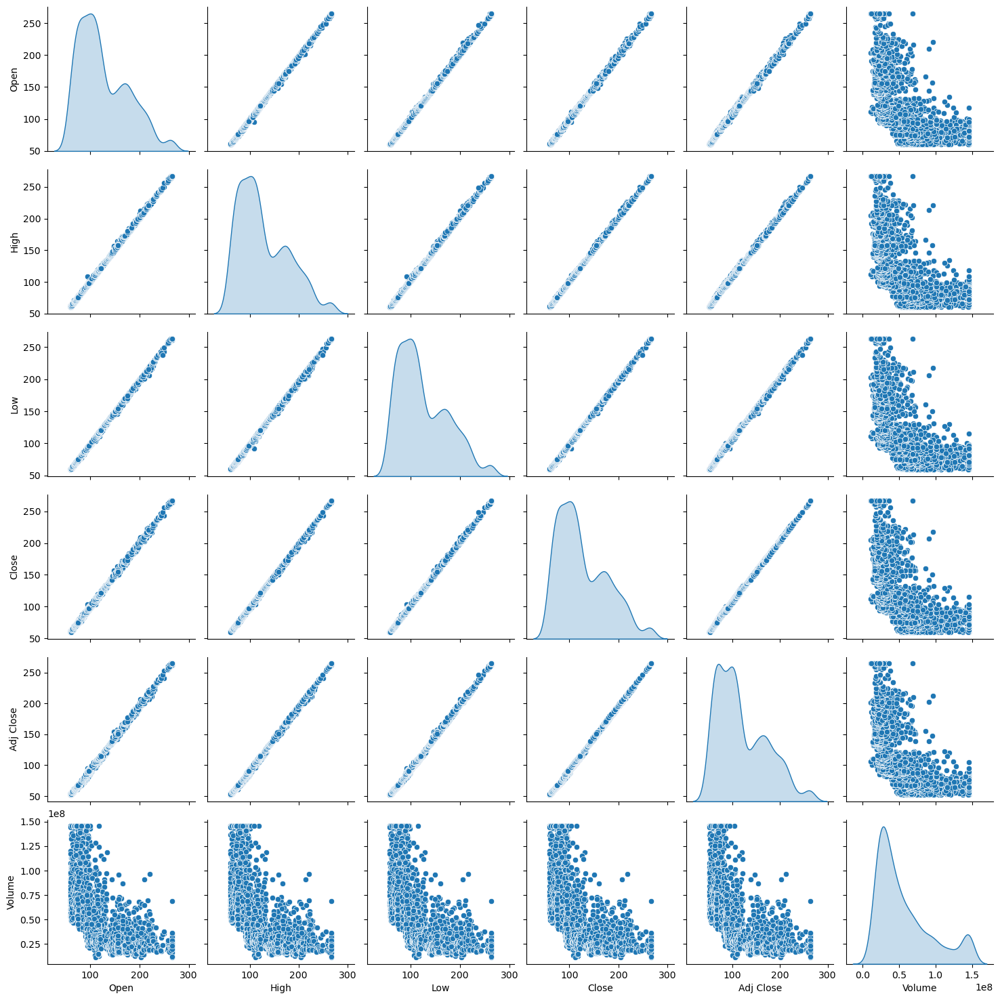

In [49]:
# Pairplot to observe relation among columns and also distribution
sns.pairplot(df,diag_kind='kde')
plt.show()

In [50]:
# Calulating the kurtosis values for the columns
df.kurtosis()

Open        -0.298393
High        -0.307371
Low         -0.298476
Close       -0.289284
Adj Close   -0.293427
Volume       0.200077
dtype: float64

Observation:

Kernel density (kde) plots helps to visualize the distribution of values in the time series.

Also, helps in identifying outliers and understanding the data's central tendencies.

It can be observed from above pair plot that distribution of columns is not normal and all features are right skewed (+ve skewness).

In [52]:
# Correlation among columns
df.corr()

,Open,High,Low,Close,Adj Close,Volume
Open,1.000000,0.999784,0.999722,0.999504,0.998901,-0.625064
High,0.999784,1.000000,0.999659,0.999748,0.999165,-0.622111
Low,0.999722,0.999659,1.000000,0.999770,0.999179,-0.630645
Close,0.999504,0.999748,0.999770,1.000000,0.999400,-0.626732
Adj Close,0.998901,0.999165,0.999179,0.999400,1.000000,-0.633765
Volume,-0.625064,-0.622111,-0.630645,-0.626732,-0.633765,1.000000


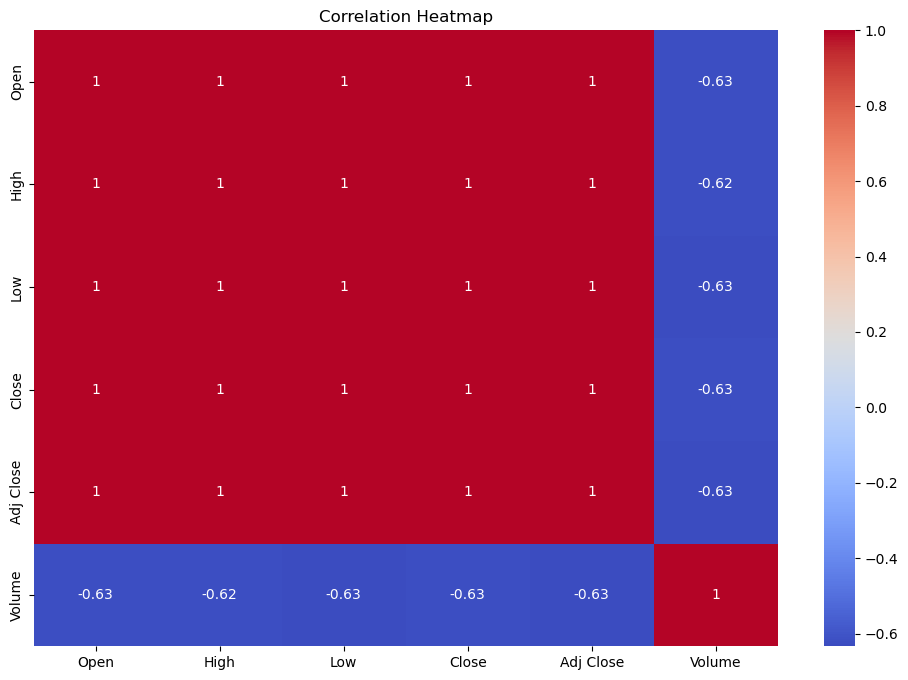

In [53]:
# Correlation using heatmap
plt.figure(figsize=(12,8))
sns.heatmap(df.corr(), annot=True, cmap='coolwarm')
plt.title('Correlation Heatmap')
plt.show()

Observation:

Features 'Open', 'High', 'Low', 'Close' and 'Adj Close' are linearly correlated to each other. Therefore, nature of all the columns will be same.

Volume has very low correlation with other columns.

### Moving Averages / Rolling Means

How Does Moving Average Help Understand the Data?


1. Trend Identification: Moving averages help to smooth out price data over a specified period of time, allowing you to identify the underlying trend (upward, downward, or sideways).

2. Noise Reduction: In volatile markets, prices fluctuate a lot within short periods. Moving averages reduce this volatility and make it easier to focus on the general direction of the data.

3. Support and Resistance: In stock markets, moving averages can act as support or resistance levels. Traders often use them to make buying or selling decisions.

4. Crossover Signals: Different types of moving averages (like short-term and long-term) can generate signals. For example, if a short-term moving average crosses above a long-term moving average, it might signal a buy (called a "golden cross"). If it crosses below, it could signal a sell (called a "death cross")

Simple Moving Averages

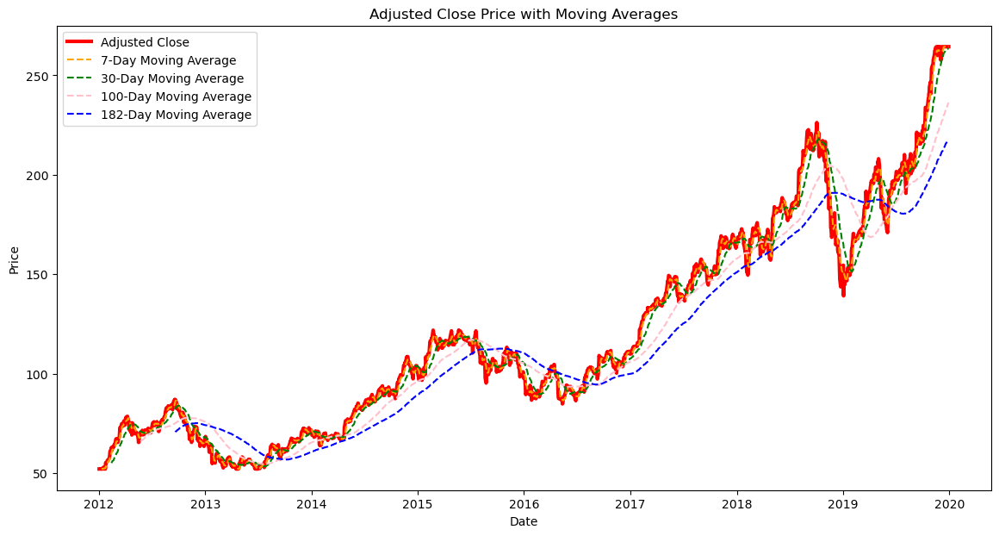

In [58]:
# Adding moving averages columns for visualization of smoothing
# Moving Averages (on raw 'Adj Close')
df['MA_7'] = df['Adj Close'].rolling(window=7).mean() # 1 week
df['MA_30'] = df['Adj Close'].rolling(window=30).mean()  # 1 month
df['MA_100'] = df['Adj Close'].rolling(window=100).mean() # 100 days
df['MA_182'] = df['Adj Close'].rolling(window=182).mean() # 6 months

# Plotting the moving averages with the original Adj Close
plt.figure(figsize=(14, 7))

# Plot original Adj Close prices
plt.plot(df['Adj Close'], label='Adjusted Close',color = 'red', linewidth=3)

# Plot moving averages with different windows
plt.plot(df['MA_7'], label='7-Day Moving Average', color='orange', linestyle='--')
plt.plot(df['MA_30'], label='30-Day Moving Average', color='green', linestyle='--')
plt.plot(df['MA_100'], label='100-Day Moving Average', color='pink', linestyle='--')
plt.plot(df['MA_182'], label='182-Day Moving Average', color='blue', linestyle='--')

# Set title and labels
plt.title('Adjusted Close Price with Moving Averages')
plt.xlabel('Date')
plt.ylabel('Price')
plt.legend()
plt.show()

The Simple Moving Average (SMA) is calculated by taking the arithmetic mean of a given set of values over a specific number of periods. It gives equal weight to all data points within the specified window.

Exponential Moving Average

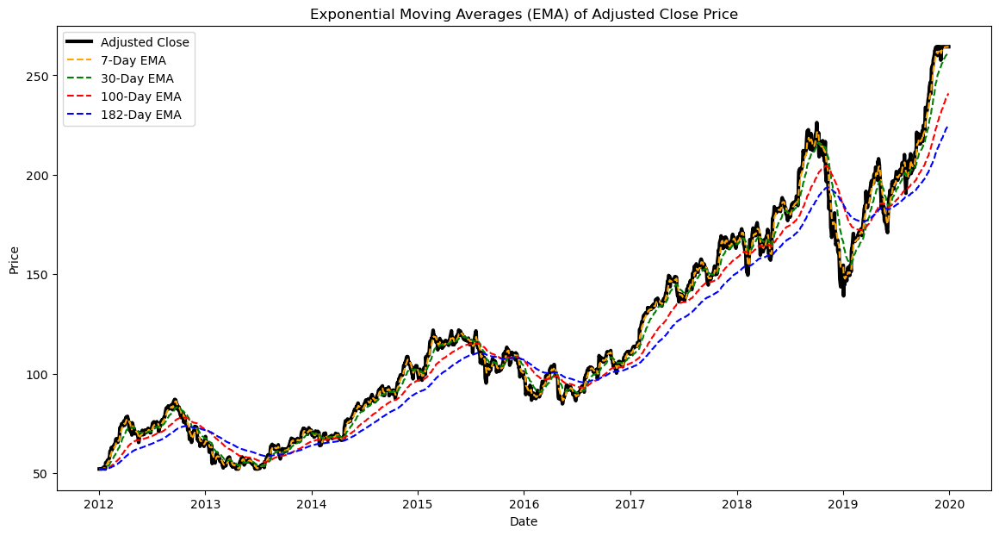

In [61]:
# Calculate Exponential Moving Averages (EMA)
df['EMA_7'] = df['Adj Close'].ewm(span=7, adjust=False).mean()
df['EMA_30'] = df['Adj Close'].ewm(span=30, adjust=False).mean()
df['EMA_100'] = df['Adj Close'].ewm(span=100, adjust=False).mean()
df['EMA_182'] = df['Adj Close'].ewm(span=182, adjust=False).mean()

# Plotting the EMAs
plt.figure(figsize=(14, 7))

# Plot original Adjusted Close prices
plt.plot(df['Adj Close'], label='Adjusted Close', linewidth=3, color='black')

# Plot Exponential Moving Averages with different windows
plt.plot(df['EMA_7'], label='7-Day EMA', color='orange', linestyle='--')
plt.plot(df['EMA_30'], label='30-Day EMA', color='green', linestyle='--')
plt.plot(df['EMA_100'], label='100-Day EMA', color='red', linestyle='--')
plt.plot(df['EMA_182'], label='182-Day EMA', color='blue', linestyle='--')

# Set title and labels
plt.title('Exponential Moving Averages (EMA) of Adjusted Close Price')
plt.xlabel('Date')
plt.ylabel('Price')
plt.legend()

# Show the plot
plt.show()

In [62]:
df

,Open,High,Low,Close,Adj Close,Volume,MA_7,MA_30,MA_100,MA_182,EMA_7,EMA_30,EMA_100,EMA_182
Date,,,,,,,,,,,,,,
2012-01-03,59.944285,60.248857,58.988572,59.725142,52.069964,75555200.0,NaN,NaN,NaN,NaN,52.069964,52.069964,52.069964,52.069964
2012-01-04,59.944285,60.248857,58.988572,59.725142,52.069964,65005500.0,NaN,NaN,NaN,NaN,52.069964,52.069964,52.069964,52.069964
2012-01-05,59.944285,60.248857,58.988572,59.725142,52.069964,67817400.0,NaN,NaN,NaN,NaN,52.069964,52.069964,52.069964,52.069964
2012-01-06,59.967144,60.392857,59.888573,60.342857,52.144630,79573200.0,NaN,NaN,NaN,NaN,52.088630,52.074781,52.071442,52.070780
2012-01-09,60.785713,61.107143,60.192856,60.247143,52.069964,98506100.0,NaN,NaN,NaN,NaN,52.083964,52.074470,52.071413,52.070771
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2019-12-23,265.777988,267.402994,263.406012,266.237009,264.412848,24643000.0,264.412848,263.027372,233.545687,216.159432,264.330922,260.310052,238.931203,223.398093
2019-12-24,265.777988,267.402994,263.406012,266.237009,264.412848,12119700.0,264.412848,263.161017,234.177306,216.548619,264.351404,260.574748,239.435790,223.846342
2019-12-26,265.777988,267.402994,263.406012,266.237009,264.412848,23280300.0,264.412848,263.302607,234.914275,216.921069,264.366765,260.822368,239.930385,224.289692


The Exponential Moving Average (EMA) gives more weight to recent prices, making it more responsive to new data than the SMA. It is more sensitive to short-term price movements, which is useful when the recent data is more relevant for forecasting.

**Differences between SMA and EMA**

01. SMA - Smooths data and highlights longer-term trends. It is slower to react to recent price changes because it treats all data points equally.

    SMA is good for understanding longer-term trends and when you're not worried about minor fluctuations.

02. Gives more weight to recent data, so it is faster at detecting changes in trends but may be more volatile.

    EMA is better when you want to react quickly to recent price changes and spot short-term trends or reversals faster.

### Data Manipulations and Furthur Visualizations

In [66]:
# Calculate daily return as percentage change in 'Close' price
df['Daily_Return'] = df['Close'].pct_change() * 100  # Multiply by 100 for percentage

# Drop any rows with NaN values resulting from the calculation
df.dropna(inplace=True)

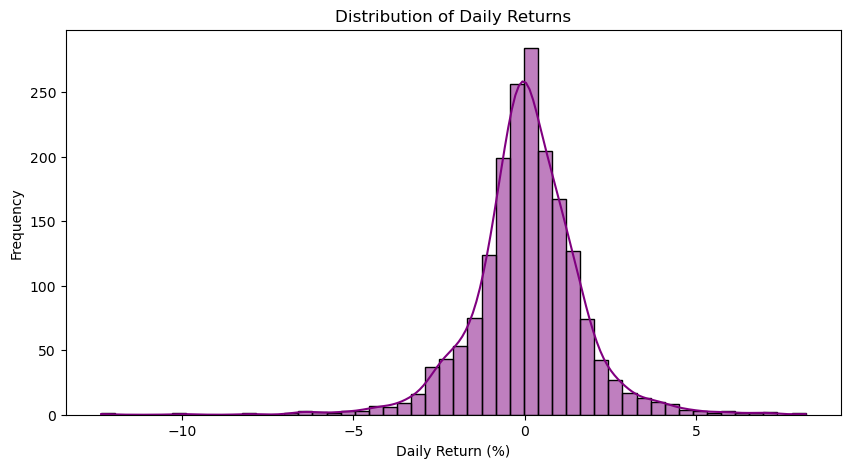

In [67]:
# Plot histogram of daily returns to understand return distribution and volatility
plt.figure(figsize=(10, 5))
sns.histplot(df['Daily_Return'], bins=50, kde=True, color='purple')
plt.title('Distribution of Daily Returns')
plt.xlabel('Daily Return (%)')
plt.ylabel('Frequency')
plt.show()

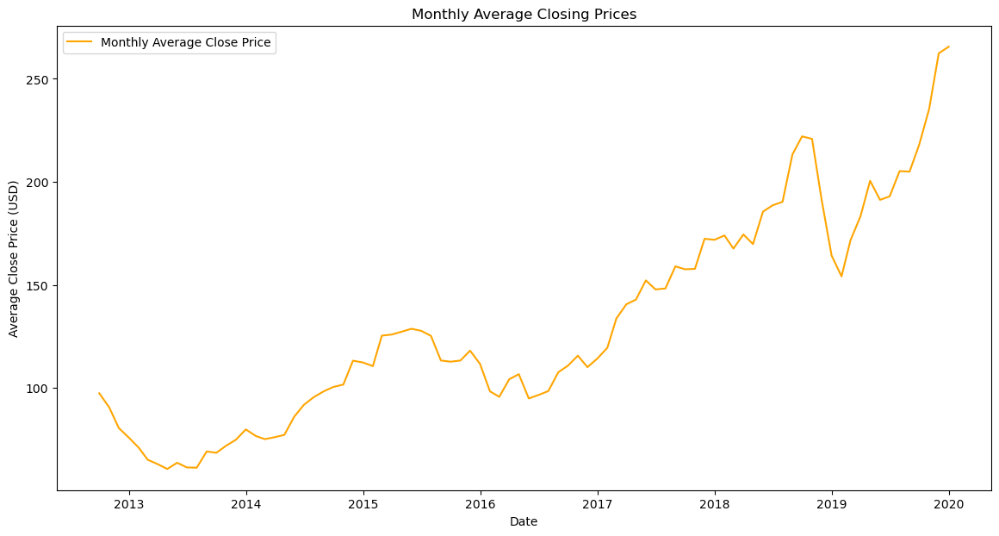

In [68]:
# Calculate the average monthly closing price
monthly_avg_close = df['Close'].resample('M').mean()

# Plot the monthly average closing price to observe any seasonal patterns
plt.figure(figsize=(14, 7))
plt.plot(monthly_avg_close, label='Monthly Average Close Price', color='orange')
plt.title('Monthly Average Closing Prices')
plt.xlabel('Date')
plt.ylabel('Average Close Price (USD)')
plt.legend()
plt.show()

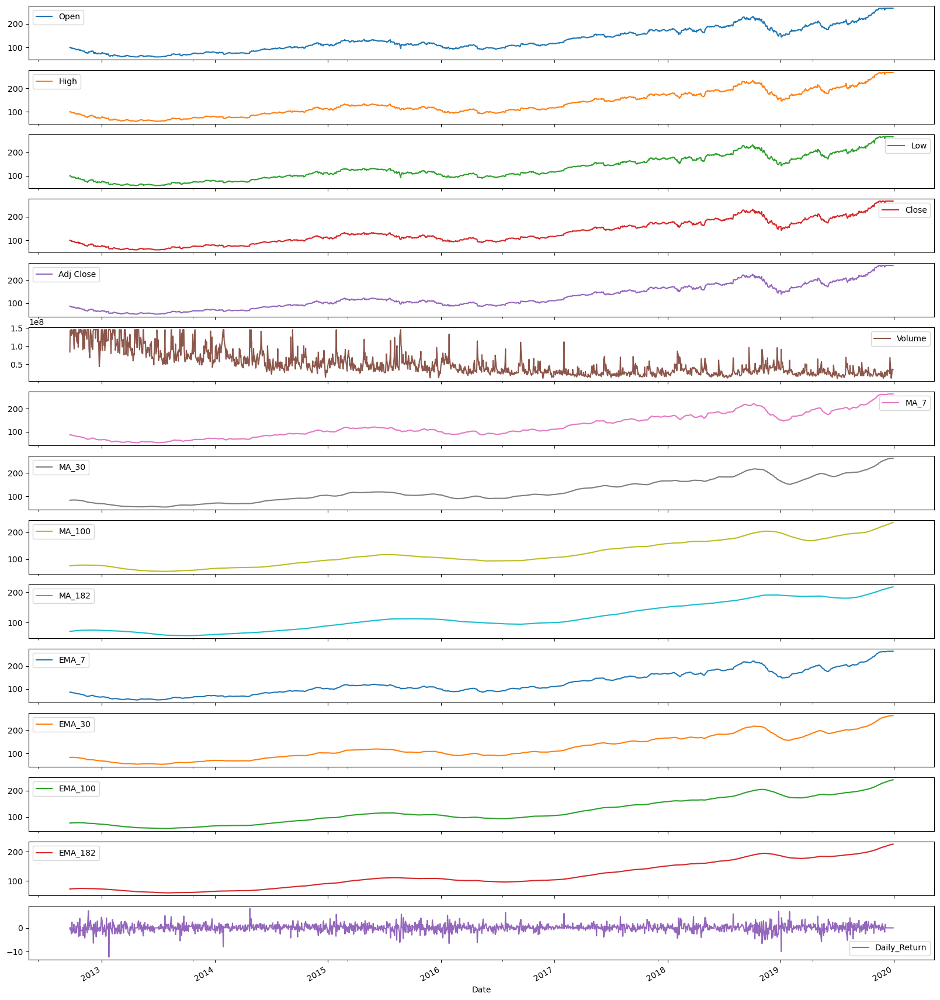

In [69]:
# here this is showing us each columns growth
df.plot(subplots=True, figsize=(20,24))
plt.show()

### Decomposing the time series for Trend, Seasonality, and Residuals

Multiplicative Decomposition

In [72]:
decomposition_m = seasonal_decompose(df['Adj Close'], model='multiplicative', period=30)

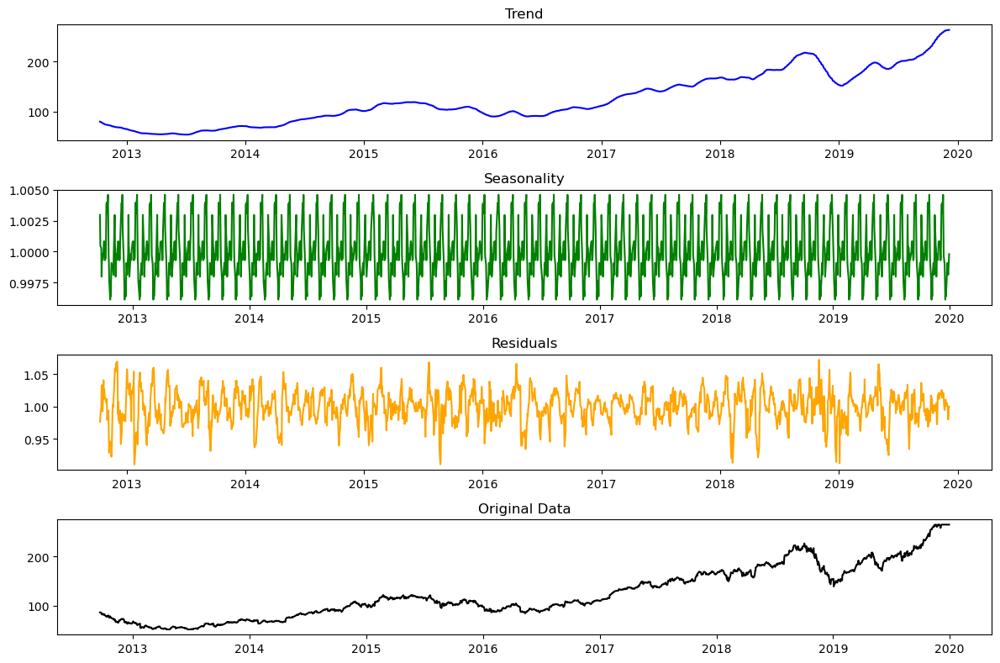

In [73]:
# Plot the decomposed components
plt.figure(figsize=(12, 8))

# Trend
plt.subplot(411)
plt.plot(decomposition_m.trend, label='Trend', color='blue')
plt.title('Trend')

# Seasonal
plt.subplot(412)
plt.plot(decomposition_m.seasonal, label='Seasonality', color='green')
plt.title('Seasonality')

# Residuals
plt.subplot(413)
plt.plot(decomposition_m.resid, label='Residuals', color='orange')
plt.title('Residuals')

# Original data
plt.subplot(414)
plt.plot(df['Adj Close'], label='Original Data', color='black')
plt.title('Original Data')

plt.tight_layout()
plt.show()

Additive Decomposition

In [75]:
# Decompose the 'Adj Close' column (Adjusted Close Price)
decomposition_a = seasonal_decompose(df['Adj Close'], model='additive', period=365)

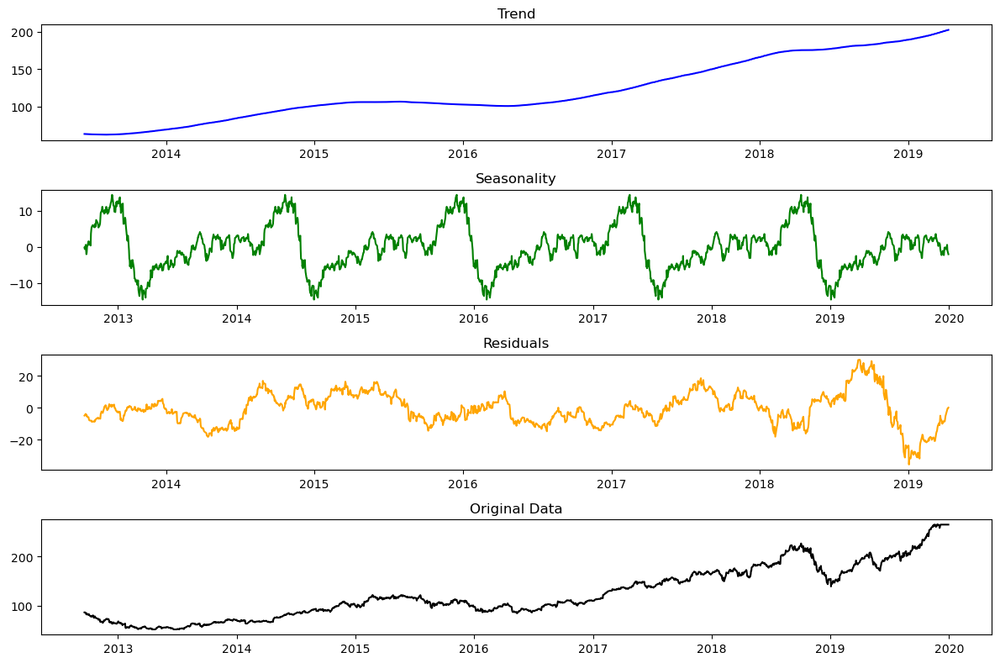

In [76]:
# Plot the decomposed components
plt.figure(figsize=(12, 8))

# Trend
plt.subplot(411)
plt.plot(decomposition_a.trend, label='Trend', color='blue')
plt.title('Trend')

# Seasonal
plt.subplot(412)
plt.plot(decomposition_a.seasonal, label='Seasonality', color='green')
plt.title('Seasonality')

# Residuals
plt.subplot(413)
plt.plot(decomposition_a.resid, label='Residuals', color='orange')
plt.title('Residuals')

# Original data
plt.subplot(414)
plt.plot(df['Adj Close'], label='Original Data', color='black')
plt.title('Original Data')

plt.tight_layout()
plt.show()

01. Additive Model: Assumes the data is the sum of the components:
    
    y(t)=Trend(t)+Seasonality(t)+Residuals(t)

02. Multiplicative Model: Assumes the data is the product of the components:
    
    y(t)=Trend(t)×Seasonality(t)×Residuals(t)

## Model Building

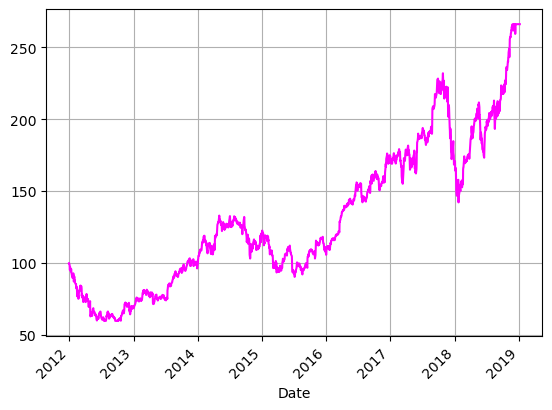

<Figure size 2000x800 with 0 Axes>

In [180]:
# Plot the 'Close' column with specific color
df['Close'].plot(color='magenta')

# Add grid lines
plt.grid(True)

# Customize x-ticks
plt.xticks(ticks=df.index[::len(df)//7],  # Show 7 ticks
           labels=['2012', '2013', '2014', '2015', '2016', '2017', '2018', '2019'], rotation=45)

# Set figure size
plt.figure(figsize=(20, 8))

plt.show()

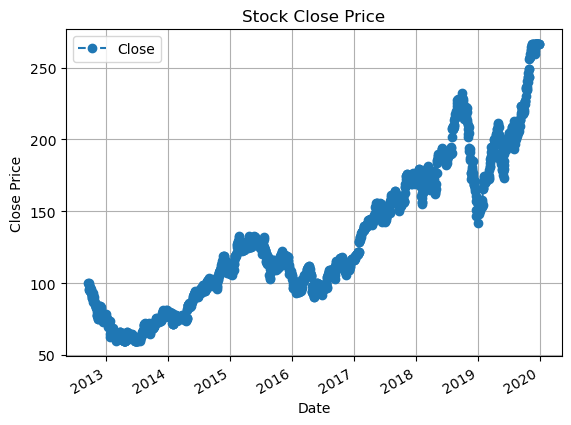

In [178]:
# Plot only the 'Close' column with specific style
df['Close'].plot(legend=True, linestyle='--', marker='o')

# Customize the plot (optional)
plt.xlabel('Date')
plt.ylabel('Close Price')
plt.title('Stock Close Price')
plt.grid(True)

plt.show()

<Axes: xlabel='Close', ylabel='Count'>

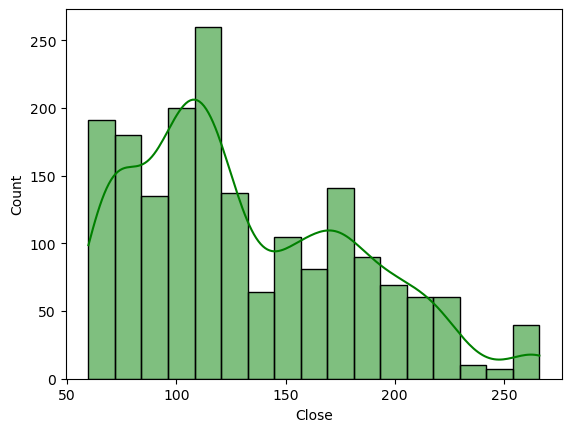

In [182]:
sns.histplot(df['Close'] , kde = True ,color = 'green')
#sns.lineplot(data['Close'])

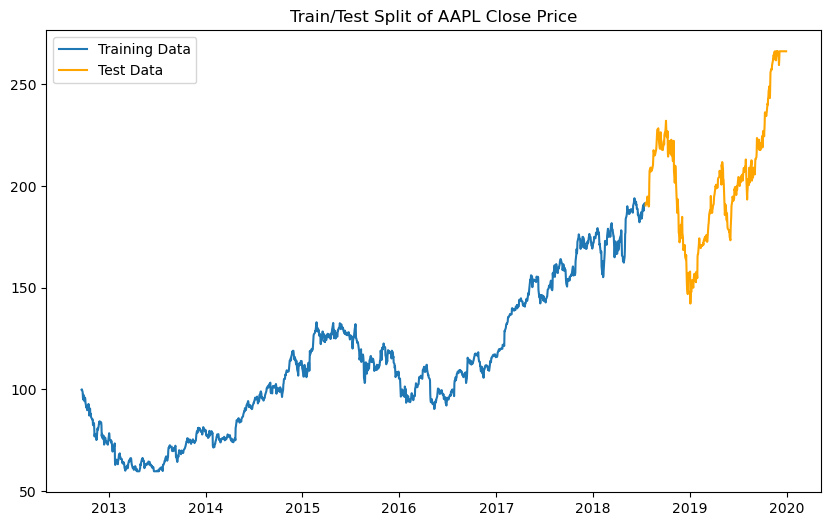

In [184]:
# Use the 'Close' price for modeling
ts_data = df['Close']

# Split into train and test sets (80% train, 20% test)
train_size = int(len(ts_data) * 0.8)
train, test = ts_data[:train_size], ts_data[train_size:]

# Plotting the data
plt.figure(figsize=(10, 6))
plt.plot(train, label='Training Data')
plt.plot(test, label='Test Data', color='orange')
plt.title('Train/Test Split of AAPL Close Price')
plt.legend()
plt.show()

**Statistical models - ARIMA , SARIMA , ETS**

## 1. ARIMA Model

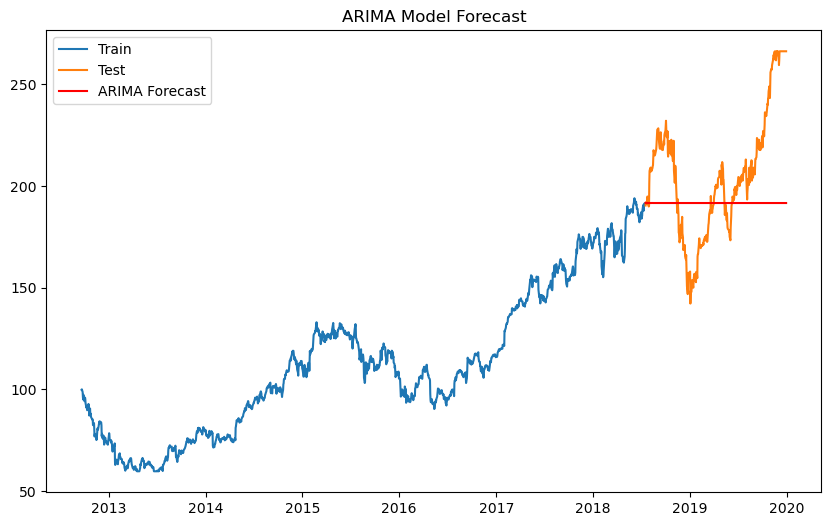

In [188]:
from statsmodels.tsa.arima.model import ARIMA

# Fit ARIMA model (p,d,q)
arima_model = ARIMA(train, order=(2,1,2))
arima_fit = arima_model.fit()

# Forecasting the test set
arima_forecast = arima_fit.forecast(steps=len(test))

# Plot forecast vs actual
plt.figure(figsize=(10, 6))
plt.plot(train, label='Train')
plt.plot(test, label='Test')
plt.plot(test.index, arima_forecast, label='ARIMA Forecast', color='red')
plt.title('ARIMA Model Forecast')
plt.legend()
plt.show()

In [190]:
from sklearn.metrics import mean_squared_error, mean_absolute_error
import numpy as np

# RMSE and MAE for ARIMA (as an example)
rmse_arima = np.sqrt(mean_squared_error(test, arima_forecast))
mae_arima = mean_absolute_error(test, arima_forecast)

print("AIAMA MODEL")

print(f'ARIMA RMSE: {rmse_arima}')
print(f'ARIMA MAE: {mae_arima}')

AIAMA MODEL
ARIMA RMSE: 32.821471440983935
ARIMA MAE: 25.777627486712806


## 2. SARIMA Model

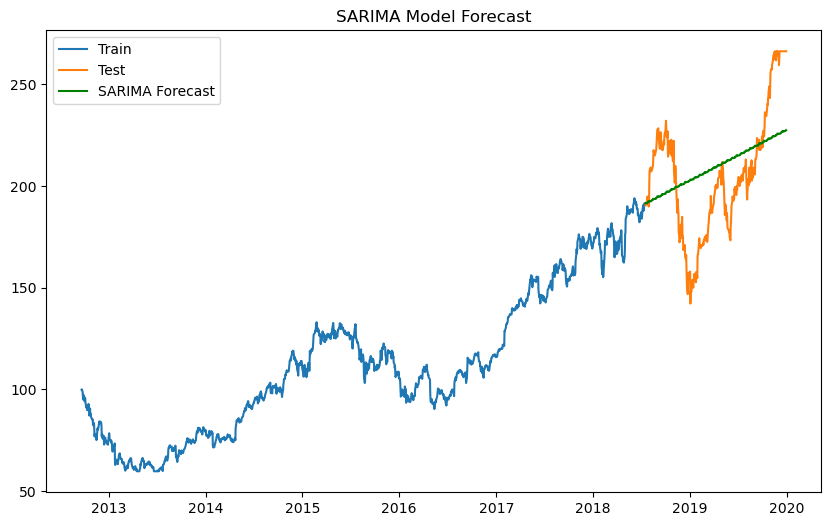

In [193]:
from statsmodels.tsa.statespace.sarimax import SARIMAX

# Fit SARIMA model (p,d,q) x (P,D,Q,s) with seasonal components
sarima_model = SARIMAX(train, order=(1, 1, 1), seasonal_order=(1, 1, 1, 12))
sarima_fit = sarima_model.fit()

# Forecasting
sarima_forecast = sarima_fit.forecast(steps=len(test))

# Plot forecast vs actual
plt.figure(figsize=(10, 6))
plt.plot(train, label='Train')
plt.plot(test, label='Test')
plt.plot(test.index, sarima_forecast, label='SARIMA Forecast', color='green')
plt.title('SARIMA Model Forecast')
plt.legend()
plt.show()

In [195]:
rmse_sarima = np.sqrt(mean_squared_error(test, sarima_forecast))
mae_sarima = mean_absolute_error(test, sarima_forecast)

print("SARIMA MODEL")

print(f'SARIMA RMSE: {rmse_sarima}')
print(f'SARIMA MAE: {mae_sarima}')

SARIMA MODEL
SARIMA RMSE: 26.397728453172434
SARIMA MAE: 22.50291973513565


## 3.ETS - Exponential Smoothing Model

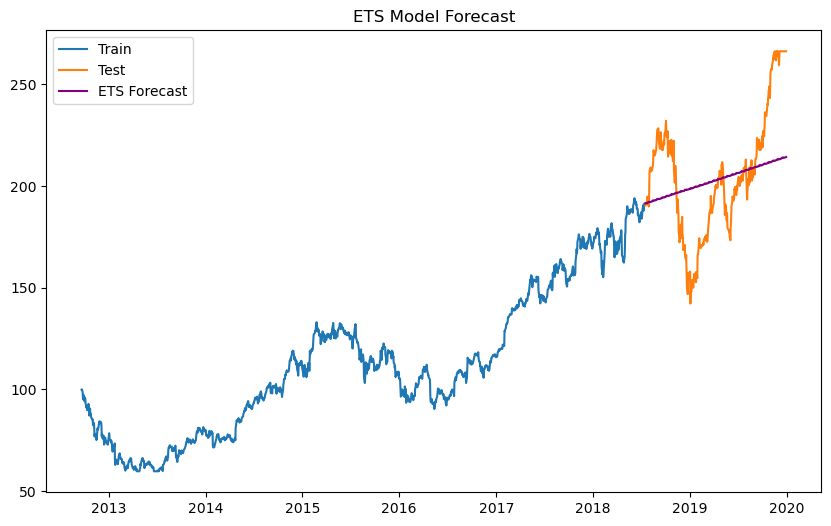

In [198]:
from statsmodels.tsa.holtwinters import ExponentialSmoothing

# Fit Exponential Smoothing model (additive for trend/seasonality)
ets_model = ExponentialSmoothing(train, trend='add', seasonal='add', seasonal_periods=12)
ets_fit = ets_model.fit()

# Forecasting
ets_forecast = ets_fit.forecast(steps=len(test))

# Plot forecast vs actual
plt.figure(figsize=(10, 6))
plt.plot(train, label='Train')
plt.plot(test, label='Test')
plt.plot(test.index, ets_forecast, label='ETS Forecast', color='purple')
plt.title('ETS Model Forecast')
plt.legend()
plt.show()


In [200]:
rmse_ets = np.sqrt(mean_squared_error(test, ets_forecast))
mae_ets = mean_absolute_error(test, ets_forecast)

print("ETS MODEL")

print(f'ETS RMSE: {rmse_ets}')
print(f'ETS MAE: {mae_ets}')

ETS MODEL
ETS RMSE: 27.167260505383407
ETS MAE: 21.894514600703832


## Deep Learning Models - RNN , GRU, LSTM

In [203]:
!pip install keras

## 4. RNN - Recuurent Neural Network Model

Epoch 1/50
91/91 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 0.0163
Epoch 2/50
91/91 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 8.7425e-04
Epoch 3/50
91/91 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 6.2119e-04
Epoch 4/50
91/91 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 4.2369e-04
Epoch 5/50
91/91 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 2.9301e-04
Epoch 6/50
91/91 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 2.1212e-04
Epoch 7/50
91/91 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 2.1760e-04
Epoch 8/50
91/91 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.6277e-04
Epoch 9/50
91/91 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.9368e-04
Epoch 10/50
91/91 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.7345e-04
Epoch 11/50
91/91 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.9327e-04
Epoch 12/50
91/91 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.7393e-04
Epoch 13/50
91/91 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 1.4905e-04
Epoch 14/50
91/91 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1.4787e-04
Epoch 15/50
91/91 ━━━━━━━━━━━━━━━

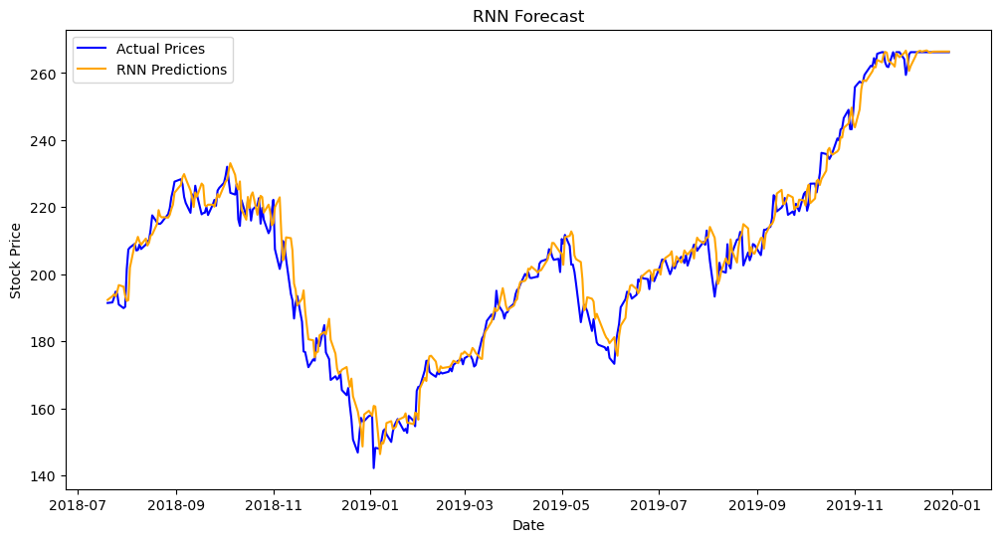

In [214]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, SimpleRNN, GRU

# Prepare data from your 'df' DataFrame
# Assuming 'df' has a datetime index and a 'close' column
data = df['Close'].values.reshape(-1, 1)

# Scale the data
scaler = MinMaxScaler(feature_range=(0, 1))
scaled_data = scaler.fit_transform(data)

# Create training and testing datasets
def create_dataset(data, time_step=1):
    X, Y = [], []
    for i in range(len(data) - time_step - 1):
        X.append(data[i:(i + time_step), 0])
        Y.append(data[i + time_step, 0])
    return np.array(X), np.array(Y)

time_step = 10  # Number of previous time steps to consider
X, y = create_dataset(scaled_data, time_step)
X = X.reshape(X.shape[0], X.shape[1], 1)  # Reshape for RNN input

# Split into training and testing sets
train_size = int(len(X) * 0.8)
X_train, X_test = X[:train_size], X[train_size:]
y_train, y_test = y[:train_size], y[train_size:]

# RNN Model
model_rnn = Sequential()
model_rnn.add(SimpleRNN(50, return_sequences=False, input_shape=(time_step, 1)))
model_rnn.add(Dense(1))

model_rnn.compile(optimizer='adam', loss='mean_squared_error')

# Train the RNN model
model_rnn.fit(X_train, y_train, epochs=50, batch_size=16)

# Make predictions with RNN
predicted_rnn = model_rnn.predict(X_test)
predicted_rnn = scaler.inverse_transform(predicted_rnn)

# Plot RNN results
plt.figure(figsize=(12, 6))
plt.plot(df.index[-len(y_test):], df['Close'].values[-len(y_test):], label='Actual Prices', color='blue')
plt.plot(df.index[-len(y_test):], predicted_rnn, label='RNN Predictions', color='orange')
plt.title('RNN Forecast')
plt.xlabel('Date')
plt.ylabel('Stock Price')
plt.legend()
plt.show()

In [210]:
mse_rnn = mean_squared_error(df['Close'].values[-len(y_test):], predicted_rnn)
mae_rnn = mean_absolute_error(df['Close'].values[-len(y_test):], predicted_rnn)
rmse_rnn = np.sqrt(mse_rnn)

print(f'RNN for Mean Squared Error: {mse_rnn}')
print(f'RNN for  Mean Absolute Error: {mae_rnn}')
print(f'RNN for root Mean Squared Error: {rmse_rnn}')

RNN for Mean Squared Error: 26.454384895063313
RNN for  Mean Absolute Error: 4.0612953414143
RNN for root Mean Squared Error: 5.143382631601825


## 5. GRU - Gated Recurrent unit Model

Epoch 1/50
91/91 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - loss: 0.0136
Epoch 2/50
91/91 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 1.6156e-04
Epoch 3/50
91/91 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 1.7342e-04
Epoch 4/50
91/91 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 1.3957e-04
Epoch 5/50
91/91 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 1.2410e-04
Epoch 6/50
91/91 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 1.5105e-04
Epoch 7/50
91/91 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 1.3183e-04
Epoch 8/50
91/91 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 1.2565e-04
Epoch 9/50
91/91 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 1.2379e-04
Epoch 10/50
91/91 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 1.2508e-04
Epoch 11/50
91/91 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 1.2283e-04
Epoch 12/50
91/91 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 1.0851e-04
Epoch 13/50
91/91 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 1.0393e-04
Epoch 14/50
91/91 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 1.0618e-04
Epoch 15/50
91/91 ━━━━━━━━━━━━━━━

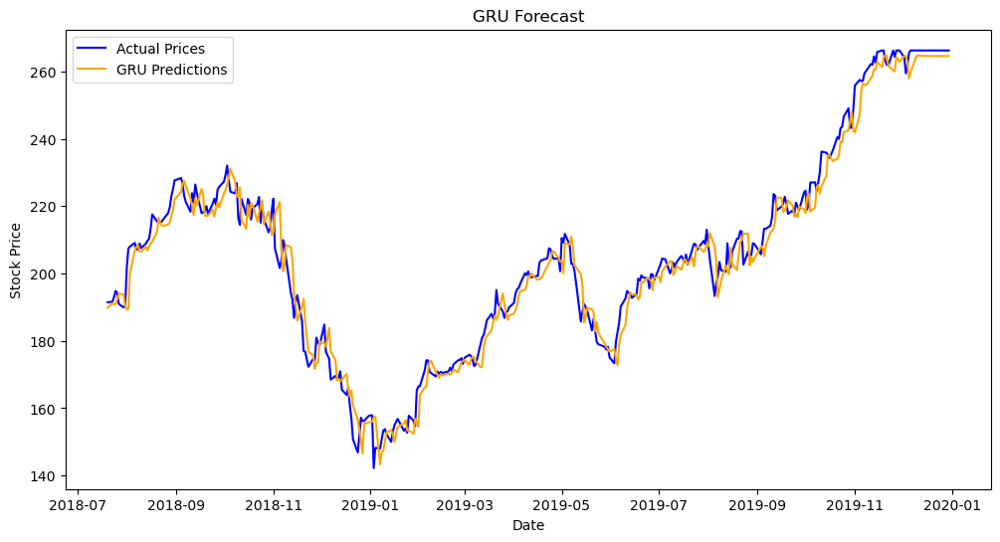

In [216]:
model_gru = Sequential()
model_gru.add(GRU(50, return_sequences=False, input_shape=(time_step, 1)))
model_gru.add(Dense(1))

model_gru.compile(optimizer='adam', loss='mean_squared_error')

# Train the GRU model
model_gru.fit(X_train, y_train, epochs=50, batch_size=16)

# Make predictions with GRU
predicted_gru = model_gru.predict(X_test)
predicted_gru = scaler.inverse_transform(predicted_gru)

# Plot GRU results
plt.figure(figsize=(12, 6))
plt.plot(df.index[-len(y_test):], df['Close'].values[-len(y_test):], label='Actual Prices', color='blue')
plt.plot(df.index[-len(y_test):], predicted_gru, label='GRU Predictions', color='orange')
plt.title('GRU Forecast')
plt.xlabel('Date')
plt.ylabel('Stock Price')
plt.legend()
plt.show()

In [218]:
mse_gru = mean_squared_error(df['Close'].values[-len(y_test):], predicted_gru)
mae_gru = mean_absolute_error(df['Close'].values[-len(y_test):], predicted_gru)
rmse_gru = np.sqrt(mse_gru)

print(f'GRU Mean Squared Error: {mse_gru}')
print(f'GRU Mean Absolute Error: {mae_gru}')
print(f'GRU for root Mean Squared Error: {rmse_gru}')

GRU Mean Squared Error: 25.740220400640492
GRU Mean Absolute Error: 3.9547794334204376
GRU for root Mean Squared Error: 5.0734820784783


## 6. LSTM Model

Epoch 1/50
91/91 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - loss: 0.0174
Epoch 2/50
91/91 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 2.8575e-04
Epoch 3/50
91/91 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 2.6133e-04
Epoch 4/50
91/91 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 2.5621e-04
Epoch 5/50
91/91 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 2.3377e-04
Epoch 6/50
91/91 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 2.3744e-04
Epoch 7/50
91/91 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 2.3956e-04
Epoch 8/50
91/91 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 2.2156e-04
Epoch 9/50
91/91 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 2.1704e-04
Epoch 10/50
91/91 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 2.1263e-04
Epoch 11/50
91/91 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 2.1223e-04
Epoch 12/50
91/91 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 2.0187e-04
Epoch 13/50
91/91 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 2.0890e-04
Epoch 14/50
91/91 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 2.0484e-04
Epoch 15/50
91/91 ━━━━━━━━━━━━━━━

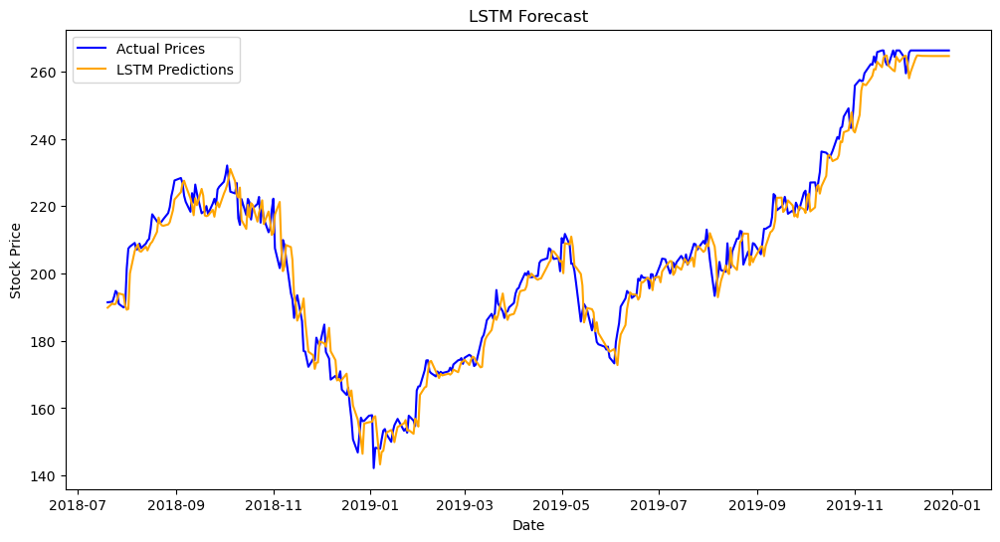

In [221]:
from keras.layers import Dense, LSTM

model_lstm = Sequential()
model_lstm.add(LSTM(50, return_sequences=False, input_shape=(time_step, 1)))
model_lstm.add(Dense(1))

model_lstm.compile(optimizer='adam', loss='mean_squared_error')

# Train the GRU model
model_lstm.fit(X_train, y_train, epochs=50, batch_size=16)

# Make predictions with GRU
predicted_lstm = model_lstm.predict(X_test)
predicted_lstm = scaler.inverse_transform(predicted_lstm)

# Plot GRU results
plt.figure(figsize=(12, 6))
plt.plot(df.index[-len(y_test):], df['Close'].values[-len(y_test):], label='Actual Prices', color='blue')
plt.plot(df.index[-len(y_test):], predicted_gru, label='LSTM Predictions', color='orange')
plt.title('LSTM Forecast')
plt.xlabel('Date')
plt.ylabel('Stock Price')
plt.legend()
plt.show()

In [229]:
mse_lstm = mean_squared_error(df['Close'].values[-len(y_test):], predicted_lstm)
mae_lstm = mean_absolute_error(df['Close'].values[-len(y_test):], predicted_lstm)
rmse_lstm = np.sqrt(mse_lstm)

print(f'LSTM Mean Squared Error: {mse_lstm}')
print(f'LSTM Mean Absolute Error: {mae_lstm}')
print(f'LSTM for root Mean Squared Error: {rmse_lstm}')

LSTM Mean Squared Error: 26.383569038632636
LSTM Mean Absolute Error: 3.760237674665715
LSTM for root Mean Squared Error: 5.136493846840725


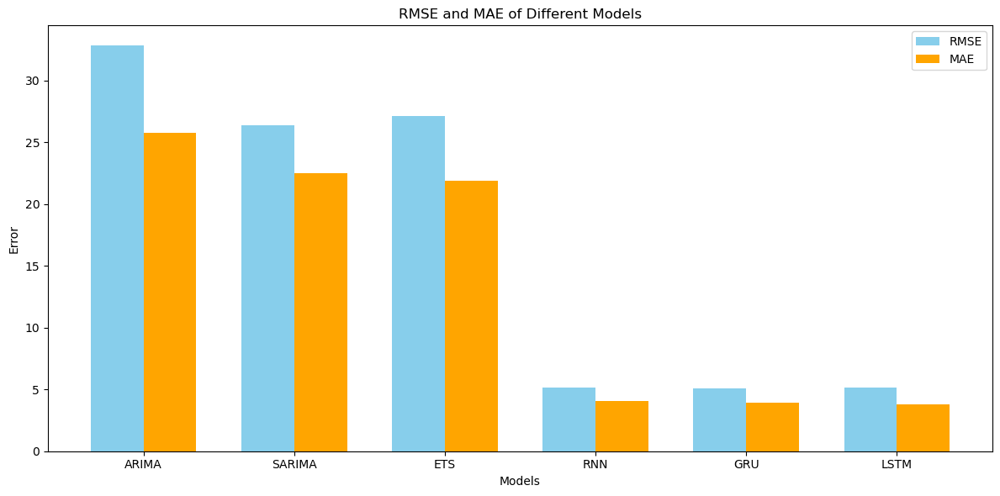

In [231]:
import matplotlib.pyplot as plt
import numpy as np

# Example data: replace with your actual MSE and MAE values for each model
model_names = ['ARIMA' , 'SARIMA' , 'ETS' , 'RNN' , 'GRU' , 'LSTM' ]
mse_values = [rmse_arima , rmse_sarima , rmse_ets ,rmse_rnn , rmse_gru , rmse_lstm ]  # Example MSE values
mae_values = [mae_arima , mae_sarima , mae_ets ,mae_rnn , mae_gru  , mae_lstm ]  # Example MAE values

# Set up the plot
fig, ax = plt.subplots(figsize=(12, 6))

# Create bar positions
x = np.arange(len(model_names))

# Width of the bars
width = 0.35

# Plot MSE values
bar1 = ax.bar(x - width/2, mse_values, width, label='RMSE', color='skyblue')

# Plot MAE values
bar2 = ax.bar(x + width/2, mae_values, width, label='MAE', color='orange')

# Adding labels and title
ax.set_xlabel('Models')
ax.set_ylabel('Error')
ax.set_title('RMSE and MAE of Different Models')
ax.set_xticks(x)
ax.set_xticklabels(model_names)
ax.legend()

# Show the plot
plt.tight_layout()
plt.show()

In [233]:
import pickle
# Save the scaler to a pickle file
with open('scaler.pkl', 'wb') as f:
    pickle.dump(scaler, f)

In [235]:
# Now save the model in a pickle file
with open('lstm_model.pkl', 'wb') as f:
    pickle.dump(model_lstm, f)